<a href="https://colab.research.google.com/github/AStruthers2000/Data-Structures-and-Algorithms/blob/main/CS589_Final_Report.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction
---

This report is a writeup of a simulation involving the mixing of gas molecules in a closed chamber. The problem we are trying to solve is as follows: suppose we have a box with a wall dividing the box into two eually sized parts. In one part we have a gas where the molecules are uniformly distributed in a random fashtion. At ```t=0``` we remove the wall. The goal we are trying to accomplish is to simulate the gas molecules moving around the now fully open container using a two dimensional random walk algorithm to test whether the molecules will fill the whole box, given enough time. 

# Necessary Imports
---

Before we can start coding, we need to import a few libraries used throughout the code found in this simulation. We are using ```numpy``` for vectorized calculations and data handling, and ```matplotlib``` for plotting and animating our results.

In [ ]:
import numpy
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Defining Variables
---
Before defining variables, we first create a ```Rectangle``` class, which holds low and high values in both the x and y axes, as well as some helper functions to do some collision and bounds calculations easily. 

In [ ]:
class Rectangle: 
    def __init__(self, xl, xh, yl, yh):
        self.xl = xl
        self.yl = yl
        self.xh = xh
        self.yh = yh
    
    def GetXBounds(self):
        return [self.xl, self.xh]
    
    def GetYBounds(self):
        return [self.yl, self.yh]
    
    #vectorized calculation for determining if points are inside of the rectangle
    def IsPointInRect(self, point):
        inXMin = numpy.all(point[0] > self.xl)
        inXMax = numpy.all(point[0] < self.xh)
        inYMin = numpy.all(point[1] > self.yl)
        inYMax = numpy.all(point[1] < self.yh)
        return inXMin and inXMax and inYMin and inYMax
    
    def OutsideXMin(self, x):
        return x <= self.xl
    
    def OutsideXMax(self, x):
        return x >= self.xh
    
    def OutsideYMin(self, y):
        return y <= self.yl
    
    def OutsideYMax(self, y):
        return y >= self.yh

Now, To get started with this simulation, we will define a few variables that will be useful throughout the code. 

In [ ]:
#defining the possible movement directions
NORTH = 1
SOUTH = 2
WEST = 3
EAST = 4

#creating the box that we are simulating
rect = Rectangle(0, 1, 0, 1)

#creating 10,000 points and simulating for 250 steps
#this number of steps has been validated to be a sufficient number of steps to achieve a fully mixed effect
np = 10000
ns = 400

#the distance, per step, that a particle can move
particle_step = 0.05

As we can see in the code above, we have defined a few constants for the possible movement directions. In our graph that we generate at the end of the project, moving north represents an increase in the y-axis, and east represents an increase in the x-axis. Likewise, south represents a decrease in the y-axis and west a decrease in the x-axis. We defined a variable ```rect``` of type ```Rectangle```, which we discussed above. The other variables ```np```, ```ns```, and ```particle_step``` represent the number of particles, the number of steps, and the distance that a single particle travels each step respectively.

# Initializing Animation and Configuring Simulation
---

Now that we have some variables and a custom data type defined, the next step is to set up the initial values of the simulation and initialize the graphing and animation of our results. 

In [ ]:
#setting up a vectorized version of every move that each particle will make, and shaping the data into 
#a matrix with ns rows and np columns
moves = numpy.random.randint(1, 4+1, size = ns*np)
moves.shape = (ns, np)

We first define the entire set of moves used in the simulation. The variable ```moves``` will contain ```ns*np``` random numbers on the range [1, 4] (inclusive), shaped into a two dimensional array of ```ns``` rows by ```np``` columns. This will be used to feed the random walk algorithm, and has allowed us to predetermine every step the particles will take before the simulation actually starts. The benefit of generating all steps before starting the simulation is we will not be performing ```np``` random number generations per frame, greatly increasing the runtime efficiency of our random walk algorithm. 

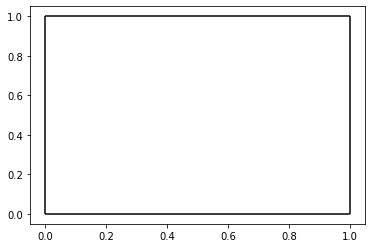

In [ ]:
fig = plt.figure()
#plt.title(f"{np} particles after 0 steps")

#drawing the actual boundries of the box we are simulating for clarity and nice visuals
plt.hlines(rect.GetYBounds()[0], rect.GetXBounds()[0], rect.GetXBounds()[1], colors='black')
plt.hlines(rect.GetYBounds()[1], rect.GetXBounds()[0], rect.GetXBounds()[1], colors='black')
plt.vlines(rect.GetXBounds()[0], rect.GetYBounds()[0], rect.GetYBounds()[1], colors='black')
plt.vlines(rect.GetXBounds()[1], rect.GetYBounds()[0], rect.GetYBounds()[1], colors='black')

#initialize the scatter plot with a blank plot and dot size of 3
s_plt = plt.scatter([], [], s = 3)

#generating a list of all frame numbers to pass to FuncAnimation, so that we don't have to keep track of the current frame number
steps = [frame_no for frame_no in range(ns)]

We start by creating a ```matplotlib``` figure and setting the title. We also draw a box using the bounds specified by the ```Rectangle``` object we created earlier to give a nice visual representation of the space in which we are running the gas simulation. Next, we set up the scatter plot data by initializing two empty arrays, one for x positions and one for y positions, and a dot size of 3. I found that a dot size of 3 was large enough to show each particle with clarity without making the box too overcrowded. Finally, we set up a list containing each step we want to compute. This will be passed into the ```matplotlib.FuncAnimation``` object we are going to create shortly. Using this list, we can keep track of the simulation's current step, which will help us select the proper set of moves. 


# Simulation and Animation Functions
---
Before we can start the simulation, we need to specify three important functions. Since we are using the ```FuncAnimation``` feature of ```matplotlib```, we must create an initialization function, called once at the beginning of the animation, and a update function, called once each frame of the animation. We will call these two functions ```init()``` and ```frame()``` respectively. 

In [ ]:
def init():
    #set the axis scale to just slightly larger than the box we are simulating
    plt.axis([rect.GetXBounds()[0] - 0.1, rect.GetXBounds()[1] + 0.1, rect.GetYBounds()[0] - 0.1, rect.GetYBounds()[1] + 0.1])
    
    #For FuncAnimation to work, we need to return a sequence of Matplotlib Artists
    #in our case, we only have one Artist, so we add the trailing comma and no second Artist to trick FuncAnimation
    return s_plt,


def frame(step):
    #tell python to use the xpositions and ypositions globally, instead of treating them like new local variables each frame
    global xpos
    global ypos

    #print(f"Calculating step {step+1}")
    
    #calculate the next position using the vectorized method for speed
    xpos, ypos = random_walk_2D(xpos, ypos, moves[step])
    
    #check to make sure that no particles randomly decided they wanted out of the simulation
    assert len(xpos) == np
    assert len(ypos) == np
    
    #set_offsets expects a Nx2 ndarray but we have two 1d position arrays
    #we can stack them together and create an ndarray with numpy.hstack
    #then give the scatter plot this frame's data
    data = numpy.hstack((xpos[:,numpy.newaxis], ypos[:,numpy.newaxis]))
    s_plt.set_offsets(data)
    
    #we update the title to reflect the current step (with a stupid conditional so that frame 1 is singular)
    plt.title(f"{np} particles after {step+1} step"+("s" if step+1>1 else ""))

    #again, we need to return a sequence of Artists to trick FuncAnimation into thinking we are giving it what it wants
    return s_plt,

Now that we have those two functions specified, we are missing one important piece of functionality. We have yet to implement the random walk algorithm called each frame! Below we can see the random walk function that calculates each new x and y position for each particle based off of the current movement we generated earlier. The random walk algorithm was implemented using vectorization instead of a standard loop, which gives us the benefit of much faster execution speed in addition to code readability. Both the ```frame()``` function and the ```random_walk_2D()``` function include a few assertions. The assertion in ```random_walk_2D()``` proves no particles have accidentally escaped the box during their movement this frame, and the assertions in ```frame()``` prove that no particles have been accidentally deleted during the movement calculations. 

In [ ]:
def random_walk_2D(xpos, ypos, this_move):
    #vectorized calculation of the random walk algorithms, based off of the current frame's list of movements
    #if the particle is told to move north, we want to move the y position up by particle_step, for example
    ypos += numpy.where(this_move == NORTH, particle_step, 0)
    ypos -= numpy.where(this_move == SOUTH, particle_step, 0)
    xpos += numpy.where(this_move == EAST,  particle_step, 0)
    xpos -= numpy.where(this_move == WEST,  particle_step, 0)
    
    #after we move the particles, we need to validate that they are still within the box we care about
    #if a particle is outside of the box, we do the exact opposite of the move that resulted in the particle momentarily escaping
    ypos -= numpy.where(rect.OutsideYMax(ypos), particle_step, 0)
    ypos += numpy.where(rect.OutsideYMin(ypos), particle_step, 0)
    xpos -= numpy.where(rect.OutsideXMax(xpos), particle_step, 0)
    xpos += numpy.where(rect.OutsideXMin(xpos), particle_step, 0)
    
    #since I wasn't confident in the opposite movement code above, we want to validate that all particles are still inside the box
    #we do this by checking if each point is inside the rectangle. If it is, we add a 1 to the proper index of valid_points
    #and a 0 if not. Then, we assert that all elements in valid_points is equal to 1. If any element is 0, the assert will fail
    #and we will know that the opposite movement code failed somewhere
    valid_points = numpy.where(rect.IsPointInRect([xpos, ypos]), 1, 0)
    assert numpy.all(valid_points==1)

    return xpos, ypos

# Running the Simulation
---
Now that we have all of the functionality set up, plenty of variables and constants initialized, and the animation configured, we can actually start running the simulation. To start, we generate the initial x and y positions of all ```np``` particles by using the ```numpy.random.uniform``` function. We generate ```np``` x positions between 0 and 1/2, and ```np``` y positions between 0 and 1, as specified in the problem statement. The variables ```xpos``` and ```ypos``` hold a list of each of the x and y positions of all particles. These two lists will be updated during each step of our simulation. Next, we set up the ```matplotlib``` plot we are going to be using for animation throughout this simulation. We then create a ```FuncAnimation``` object and pass it the figure we want to update, the update function ```frame()```, the list of all steps generated above, the initialization function ```init()```, and a few other variables that control the rendering of the animation.

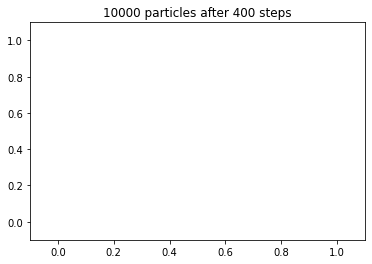

In [10]:
from matplotlib import rc
from IPython.display import HTML
rc('animation', html='html5')

#setting up the initial uniformly distributed particles inside a box of dimensions x=[0, 1/2] and y = [0, 1]
xpos = numpy.random.uniform(rect.GetXBounds()[0], rect.GetXBounds()[1]/2.0, np)
ypos = numpy.random.uniform(rect.GetYBounds()[0], rect.GetXBounds()[1], np)

#setting up and starting the animation
anim = animation.FuncAnimation(fig, frame, steps, interval = 100, init_func = init, blit = True)
HTML(anim.to_html5_video())

# Results
---
As we can see from the gif above, the simulation runs for the specified number of steps. Because we set the animation interval to 100 milliseconds, we can calculate the length of the gif by multiplying ```ns``` by 0.1, for example if ```ns=400```, we know that the gif would be 40 seconds long. At ```t=0``` we can see that all particles start on the left half of the box, which coensides with the part of the problem that reads "Initially, place 10,000 particles at uniformly distributed random positions in [0, 1/2] 𝗑 [0, 1]". The wall is then removed, and particles start moving to the empty spaces in the box. By the end of the gif, the particles are all pretty evenly distributed throughout the entire box. 

This proves our hypothesis that, given enough time, the particles would spread out to fill the whole box. The end result of this simulation is what I would expect. It is interesting, however, that the random walk algorithm with equal chance of moving in any direction results in this behavior. Intuitively, it seems like having an equal chance of moving in any direction would result in zero net change of position, but as we can see this is clearly not the case. 

One comment on the gif is that, occasionally, it looks like particles on the south and east walls are escaping momuntarily, even though we had multiple assertions to prove that this wasn't the case. What is happening is a result of how computer graphics are drawn. Each dot in the scatter plot is drawn using their size, x, and y positions. The standard for computer graphics is the x and y positions correspond to the top left most edge of the drawing, so the dots that appear to escape for a momunt only do so because their draw position is inside of the box, but the size of the dot means that parts of the dot appear outside. 

# Conclusion
---
Using a random walk algorithm, we have proven that, given enough time, gas particles will spread out until they appear to be uniformly distributed throughout the space they reside in. This random walk simulation can be used to model molecular motion in many simple cases. The simulation also provides the ability to investigate how an ordered system of gas molecules, represented by the uniform distribution of particles in half the box at the beginning of the simulation, can evolve into a more disordered system throughout time.